Setup libraries

In [1]:
from pystac_client import Client
from dask.distributed import Client as DaskClient
from odc.stac import load, configure_s3_access
import rasterio as rio
import geopandas as gpd
import pandas as pd
import numpy as np
import xarray as xr
import folium
import utils
from utils import load_data
# from utils import mask_and_scale
from sklearn.ensemble import RandomForestClassifier
import odc.geo.xr
import rioxarray
import matplotlib.pyplot as plt
import joblib
# comment


Define catalogue

In [2]:
catalogue = "https://earth-search.aws.element84.com/v1"
client = Client.open(catalogue)

In [3]:
min_lat = -18.19745
min_lon = 178.33434
max_lat = -18.10289 
max_lon = 178.53374
bbox_training = [min_lon, min_lat, max_lon, max_lat]

In [4]:
# bbox for Mana Island
min_lat_pred = -17.696139
min_lon_pred = 177.072525
max_lat_pred = -17.663205
max_lon_pred = 177.136239
bbox_prediction = [min_lon_pred, min_lat_pred, max_lon_pred, max_lat_pred]

In [5]:
# focus on dry season
datetime="2024-03/2024-10"

In [6]:
dask_client = DaskClient(n_workers=4, threads_per_worker=16, memory_limit='16GB')

#configure_s3_access(cloud_defaults=True, requester_pays=True)

In [7]:
# Search through catalogue for relevant data
items = client.search(
    collections=["sentinel-2-c1-l2a"],
    bbox=bbox_prediction,
    datetime=datetime,
    query={"eo:cloud_cover":{"lt": 24}},
).item_collection()

print(f"Found {len(items)} items")


Found 38 items


In [8]:
items

In [9]:
# data = utils.load_data
bbox=bbox_prediction
data = load_data(items, bbox)

In [10]:
# Mask out clouds and scale values
# Sentinel-2 cloud mask flags (1: defective, 3: shadow, 9: high confidence cloud, 10: thin cirrus)
mask_flags = [1, 3, 9, 10]

# Apply the cloud mask (invert the mask to keep non-cloud values)
cloud_mask = ~data.scl.isin(mask_flags)
masked = data.where(cloud_mask)

# Apply scaling and clip values from 0 to 1
scaled = (masked.where(masked != 0) * 0.0001).clip(0, 1)

In [11]:
# Create a median composite, which should get rid of most of the remaining clouds
# Note that this will take a few minutes to complete

median = scaled.median("time").compute()
median

/srv/conda/envs/notebook/lib/python3.10/site-packages/rasterio/warp.py:387: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dest = _reproject(
/srv/conda/envs/notebook/lib/python3.10/site-packages/rasterio/warp.py:387: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dest = _reproject(
/srv/conda/envs/notebook/lib/python3.10/site-packages/rasterio/warp.py:387: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dest = _reproject(
/srv/conda/envs/notebook/lib/python3.10/site-packages/rasterio/warp.py:387: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dest = _reproject(


<xarray.Dataset> Size: 13MB
Dimensions:      (y: 366, x: 676)
Coordinates:
  * y            (y) float64 3kB 8.047e+06 8.047e+06 ... 8.043e+06 8.043e+06
  * x            (x) float64 5kB 5.077e+05 5.077e+05 ... 5.144e+05 5.144e+05
    spatial_ref  int32 4B 32760
Data variables: (12/13)
    red          (y, x) float32 990kB 0.1077 0.1082 0.1082 ... 0.1053 0.1053
    green        (y, x) float32 990kB 0.1159 0.1156 0.1154 ... 0.1123 0.1126
    blue         (y, x) float32 990kB 0.1302 0.13 0.1307 ... 0.1296 0.1294
    nir08        (y, x) float32 990kB 0.1053 0.1068 0.1068 ... 0.104 0.1041
    swir16       (y, x) float32 990kB 0.1062 0.1063 0.1063 ... 0.1041 0.1042
    scl          (y, x) float32 990kB 0.0006 0.0006 0.0006 ... 0.0006 0.0006
    ...           ...
    nir09        (y, x) float32 990kB 0.0998 0.0998 0.0998 ... 0.099 0.0979
    cloud        (y, x) float32 990kB 0.0027 nan nan nan nan ... nan nan nan nan
    rededge1     (y, x) float32 990kB 0.1071 0.1085 0.1085 ... 0.1052 0.1049
    rededge3     (y, x) float32 990kB 0.1063 0.1082 0.1082 ... 0.1047 0.1048
    rededge2     (y, x) float32 990kB 0.1051 0.1071 0.1071 ... 0.1039 0.1042
    nir          (y, x) float32 990kB 0.106 0.1064 0.1059 ... 0.1032 0.1037

In [12]:
median_image = median.assign_coords(band=["aot", "blue", "coastal", "green", "nir", "nir08", "nir09", "red", "rededge1", "rededge2", "rededge3", "scl", "swir16", "swir22"])

In [13]:
stacked = median.to_array(dim="band")
stacked.rio.to_raster("median_dataset.tif")

In [14]:
# # The classes are the first column
# classes = np.array(training_array)[:, 0]

# # The observation data is everything after the first column
# observations = np.array(training_array)[:, 1:]

# Create a model...
classifier = RandomForestClassifier()

# ...and fit it to the data
# model = classifier.fit(observations, classes)

In [85]:
# Convert to a stacked array of observations
stacked_arrays = median.to_array().stack(dims=["y", "x"]).transpose()

model = joblib.load("suva-model-rf-14022025.model")

# Predict the classes
predicted = model.predict(stacked_arrays)

# Reshape back to the original 2D array
array = predicted.reshape(len(median.y), len(median.x))

# Convert to an xarray again, because it's easier to work with
predicted_da = xr.DataArray(
    array, coords={"y": median.y, "x": median.x}, dims=["y", "x"]
)

## Import validation data

In [103]:
gdf = gpd.read_file("south_suva_tdata_14022025.geojson")

In [104]:
# First transform the training points to the same CRS as the data
training = gdf.to_crs(median.odc.geobox.crs)

# Next get the X and Y values out of the point geometries
training_da = training.assign(x=training.geometry.x, y=training.geometry.y).to_xarray()

# Now we can use the x and y values (lon, lat) to extract values from the median composite
training_values = (
    median.sel(training_da[["x", "y"]], method="nearest").squeeze().compute().to_pandas()
)

len(training_values)

3534

In [105]:
# Join the training data with the extracted values and remove unnecessary columns
training_array = pd.concat([training["cc_id"], training_values], axis=1)
training_array = training_array.drop(
    columns=[
        "y",
        "x",
        "spatial_ref",
    ]
)

# # Drop rows where there was no data available
# training_array = training_array.dropna()

# Preview our resulting training array
training_array.head()

,cc_id,red,green,blue,nir08,swir16,scl,coastal,nir09,cloud,rededge1,rededge3,rededge2,nir
0,4,0.1053,0.1126,0.1294,0.1041,0.1042,0.0006,0.1316,0.0979,0.0,0.1049,0.1048,0.1042,0.1037
1,4,0.1053,0.1126,0.1294,0.1041,0.1042,0.0006,0.1316,0.0979,0.0,0.1049,0.1048,0.1042,0.1037
2,4,0.1053,0.1126,0.1294,0.1041,0.1042,0.0006,0.1316,0.0979,0.0,0.1049,0.1048,0.1042,0.1037
3,4,0.1053,0.1126,0.1294,0.1041,0.1042,0.0006,0.1316,0.0979,0.0,0.1049,0.1048,0.1042,0.1037
4,4,0.1053,0.1126,0.1294,0.1041,0.1042,0.0006,0.1316,0.0979,0.0,0.1049,0.1048,0.1042,0.1037


In [106]:
len(training_array)

3534

In [86]:
print(predicted_da.dtype)  # Check the dtype of your DataArray
predicted_da = predicted_da.astype('float32')  # Convert to float32

float64


In [87]:
predicted_da

<xarray.DataArray (y: 366, x: 676)> Size: 990kB
array([[8., 8., 8., ..., 8., 8., 8.],
       [8., 8., 8., ..., 8., 8., 8.],
       [8., 8., 8., ..., 8., 8., 8.],
       ...,
       [8., 8., 8., ..., 8., 8., 8.],
       [8., 8., 8., ..., 8., 8., 8.],
       [8., 8., 8., ..., 8., 8., 8.]], dtype=float32)
Coordinates:
  * y        (y) float64 3kB 8.047e+06 8.047e+06 ... 8.043e+06 8.043e+06
  * x        (x) float64 5kB 5.077e+05 5.077e+05 ... 5.144e+05 5.144e+05

In [88]:

# Check for NaN values
if np.isnan(median).any():
    print("NaN values found in the data")
    # Handle NaN values, e.g. by filling them
    median = median.fillna(0)  # Replace NaN with 0 or appropriate value

NaN values found in the data


In [89]:
# Check if CRS is set, if not set it
if not median.rio.crs:
    median = median.rio.write_crs("EPSG:4326")  # Set to appropriate CRS

In [90]:
# Put it all on a single interactive map
# center = [np.mean([min_lat[0], max_lat[0]]), np.mean([min_lat[1], max_lat[1]])]
# m = folium.Map(location=center, zoom_start=11)

center = [(min_lat + max_lat) / 2, (min_lon + max_lon) / 2]  # Assuming min_lon and max_lon are defined
m = folium.Map(location=center, zoom_start=13)

# RGB for the median
median.odc.to_rgba(bands=("red", "green", "blue"), vmin=0, vmax=0.3).odc.add_to(m, name="Median Composite")


# Categorical for the predicted classes and for the training data
predicted_da.odc.add_to(m, name="Predicted")
# gdf.explore(m=m, column="cc_id", legend=True, name="Training Data")

# Layer control
folium.LayerControl().add_to(m)

m

In [91]:
median

<xarray.Dataset> Size: 13MB
Dimensions:      (y: 366, x: 676)
Coordinates:
  * y            (y) float64 3kB 8.047e+06 8.047e+06 ... 8.043e+06 8.043e+06
  * x            (x) float64 5kB 5.077e+05 5.077e+05 ... 5.144e+05 5.144e+05
    spatial_ref  int32 4B 32760
Data variables: (12/13)
    red          (y, x) float32 990kB 0.1077 0.1082 0.1082 ... 0.1053 0.1053
    green        (y, x) float32 990kB 0.1159 0.1156 0.1154 ... 0.1123 0.1126
    blue         (y, x) float32 990kB 0.1302 0.13 0.1307 ... 0.1296 0.1294
    nir08        (y, x) float32 990kB 0.1053 0.1068 0.1068 ... 0.104 0.1041
    swir16       (y, x) float32 990kB 0.1062 0.1063 0.1063 ... 0.1041 0.1042
    scl          (y, x) float32 990kB 0.0006 0.0006 0.0006 ... 0.0006 0.0006
    ...           ...
    nir09        (y, x) float32 990kB 0.0998 0.0998 0.0998 ... 0.099 0.0979
    cloud        (y, x) float32 990kB 0.0027 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    rededge1     (y, x) float32 990kB 0.1071 0.1085 0.1085 ... 0.1052 0.1049
    rededge3     (y, x) float32 990kB 0.1063 0.1082 0.1082 ... 0.1047 0.1048
    rededge2     (y, x) float32 990kB 0.1051 0.1071 0.1071 ... 0.1039 0.1042
    nir          (y, x) float32 990kB 0.106 0.1064 0.1059 ... 0.1032 0.1037

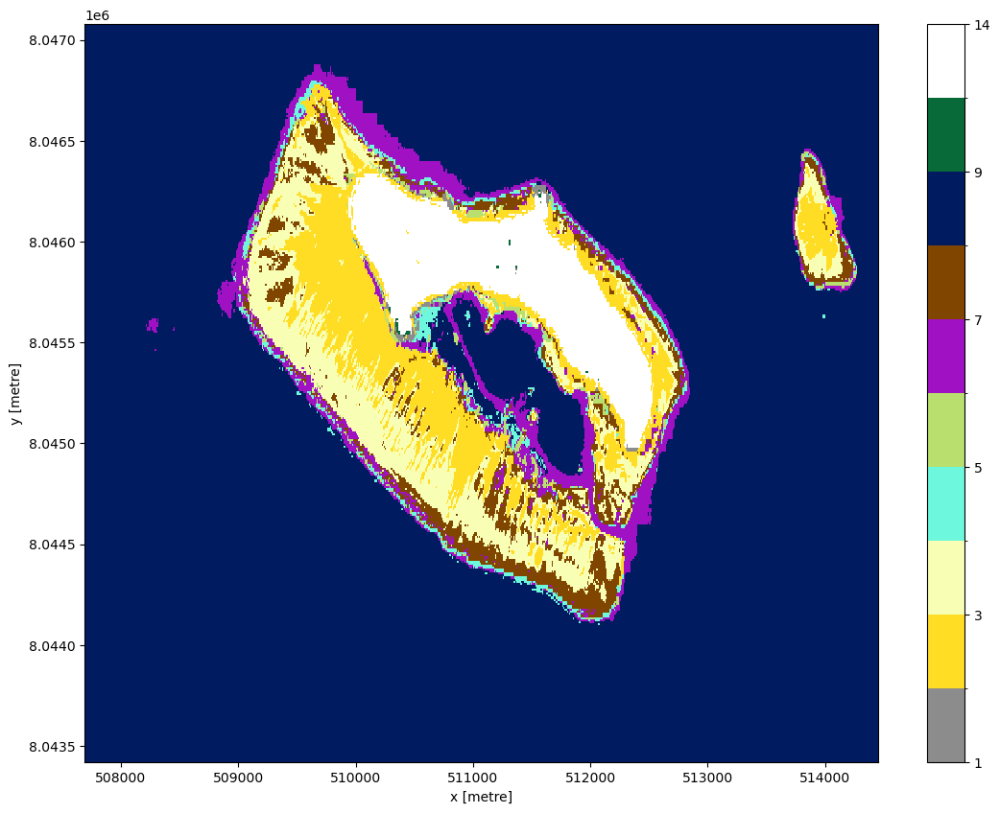

In [93]:
from matplotlib import colors

classes = [
    [1, "sediment", "#8c8c8c"],
    [2, "sand", "#fedd24"],
    [3, "rubble", "#f8ffb4"],
    [4, "seagrass", "#6df7dc"],
    [5, "seaweed", "#b9df6f"],
    [6, "coral", "#a011c3"],
    [7, "rock", "#804600"],
    [8, "deeps", "#011b61"],
    [9, "mangrove", "#086a39"],
    [10, "land", "#ffffff"],
]

values_list = [c[0] for c in classes]
color_list = [c[2] for c in classes]

# Build a listed colormap.
c_map = colors.ListedColormap(color_list)
bounds = values_list + [14]
norm = colors.BoundaryNorm(bounds, c_map.N)

predicted_da.plot.imshow(cmap=c_map, norm=norm, size=10)

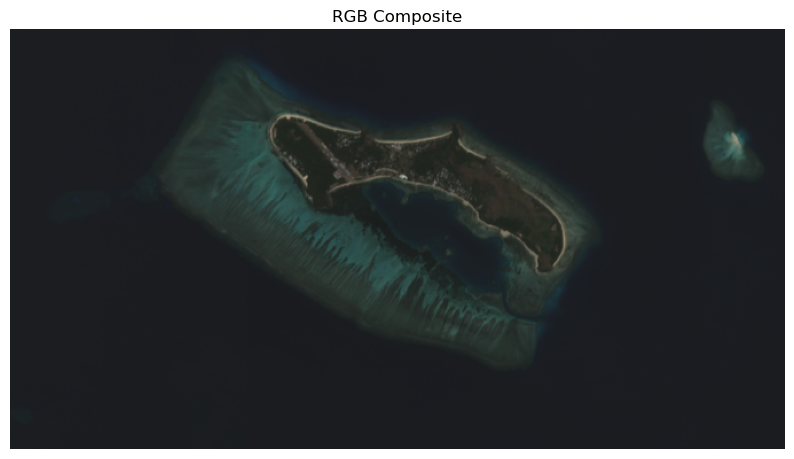

In [95]:
# Assuming ds is your xarray Dataset with separate variables "red", "green", and "blue"
# Concatenate the bands along a new "band" dimension:
rgb = xr.concat([median["red"], median["green"], median["blue"]], dim="band")

# Rearrange dimensions so that the "band" dimension is last
rgb = rgb.transpose("y", "x", "band")

plt.figure(figsize=(10, 10))
plt.imshow(rgb.values)  # .values converts the DataArray to a NumPy array
plt.title("RGB Composite")
plt.axis("off")
plt.show()

## Accuracy assessment

In [98]:
gdf

,coastal_class,cc_id,date,fid,%_cover,Minor_ecos,Notes,Photo_1,Photo_2,Surveyor,layer,path,geometry
0,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.51852 -18.17166 0)
1,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.51851 -18.17192 0)
2,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.51878 -18.17209 0)
3,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.5188 -18.17181 0)
4,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.51875 -18.17157 0)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3529,deeps,8,None,NaN,NaN,None,None,None,None,None,None,None,POINT Z (178.49341 -18.12564 0)
3530,deeps,8,None,NaN,NaN,None,None,None,None,None,None,None,POINT Z (178.49213 -18.12832 0)
3531,deeps,8,None,NaN,NaN,None,None,None,None,None,None,None,POINT Z (178.49111 -18.12963 0)
3532,deeps,8,None,NaN,NaN,None,None,None,None,None,None,None,POINT Z (178.48629 -18.13339 0)


In [107]:
# Get unique values from the column
unique_values = gdf['coastal_class'].unique()

# Print each unique value
for value in unique_values:
    print(value)

seagrass
coral
seaweed
deeps
land
sand
sediment
mangrove
rubble
rock


In [108]:
from sklearn.model_selection import train_test_split

In [109]:
print(len(training_array), len(gdf))  # Check the lengths of both arrays

3534 3534


### Split into training and testing datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)   

Where:  
X contains the features (input variables) of your dataset (the independent variables / attributes used as predictors. The columns of the dataset including the bands etc...)   
y contains the labels (target variable).  (the target - the randomforest column / class column that states what the land cover type is. This is the target / final objective of the classification)

In this case:   
X = training_array   
y = gdf.randomforest


In [111]:
X_train, X_test, y_train, y_test = train_test_split(training_array, gdf.cc_id, test_size=0.2, random_state=42)

In [112]:
y_train = y_train.astype(int)

In [113]:
# Train your model
model.fit(X_train, y_train)

RandomForestClassifier()

In [114]:
# Make predictions
y_pred = model.predict(X_test)

<Figure size 1200x1000 with 0 Axes>

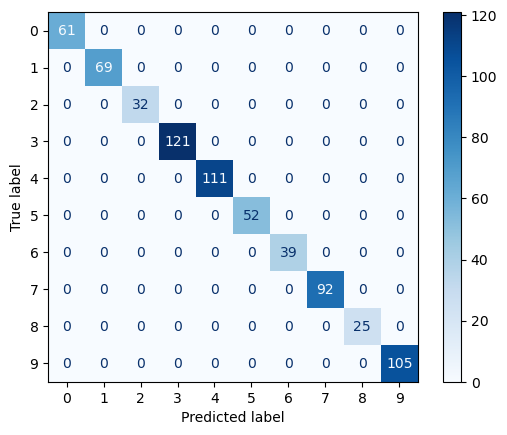

In [115]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
# Generate and display confusion matrix
cm = confusion_matrix(y_test, y_pred)
cm_display = ConfusionMatrixDisplay(confusion_matrix=cm)
plt.figure(figsize=(12, 10))  # Adjust width and height for larger plot
cm_display.plot(cmap='Blues')

In [116]:
cm

array([[ 61,   0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,  69,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,  32,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0, 121,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0, 111,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,  52,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,  39,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,  92,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,  25,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0, 105]])

In [117]:
from sklearn.metrics import accuracy_score

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

print(f'Accuracy: {accuracy:.4f}')

Accuracy: 1.0000


In [118]:
gdf

,coastal_class,cc_id,date,fid,%_cover,Minor_ecos,Notes,Photo_1,Photo_2,Surveyor,layer,path,geometry
0,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.51852 -18.17166 0)
1,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.51851 -18.17192 0)
2,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.51878 -18.17209 0)
3,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.5188 -18.17181 0)
4,seagrass,4,None,NaN,NaN,None,None,None,None,None,consolidated_3,C:/Users/nicholasm/OneDrive - SPC/Documents/20...,POINT Z (178.51875 -18.17157 0)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3529,deeps,8,None,NaN,NaN,None,None,None,None,None,None,None,POINT Z (178.49341 -18.12564 0)
3530,deeps,8,None,NaN,NaN,None,None,None,None,None,None,None,POINT Z (178.49213 -18.12832 0)
3531,deeps,8,None,NaN,NaN,None,None,None,None,None,None,None,POINT Z (178.49111 -18.12963 0)
3532,deeps,8,None,NaN,NaN,None,None,None,None,None,None,None,POINT Z (178.48629 -18.13339 0)


In [120]:
from sklearn.metrics import classification_report

# report = classification_report(true_labels, predicted_labels, target_names=class_labels)
# print(report)

report = classification_report(y_test, y_pred, target_names=['sediment', 'sand', 'rubble', 'seagrass', 'seaweed', 'coral', 'rock', 'deeps', 'mangrove', 'land'])
print(report)

              precision    recall  f1-score   support

    sediment       1.00      1.00      1.00        61
        sand       1.00      1.00      1.00        69
      rubble       1.00      1.00      1.00        32
    seagrass       1.00      1.00      1.00       121
     seaweed       1.00      1.00      1.00       111
       coral       1.00      1.00      1.00        52
        rock       1.00      1.00      1.00        39
       deeps       1.00      1.00      1.00        92
    mangrove       1.00      1.00      1.00        25
        land       1.00      1.00      1.00       105

    accuracy                           1.00       707
   macro avg       1.00      1.00      1.00       707
weighted avg       1.00      1.00      1.00       707



In [121]:
print("Unique labels in y_test:", np.unique(y_test))
print("Unique labels in y_pred:", np.unique(y_pred))

Unique labels in y_test: [ 1  2  3  4  5  6  7  8  9 10]
Unique labels in y_pred: [ 1  2  3  4  5  6  7  8  9 10]


In [122]:
print("Length of y_test:", len(y_test))
print("Length of y_pred:", len(y_pred))

Length of y_test: 707
Length of y_pred: 707
